## Imports

In [1]:
# Add parent directory to path for local imports
import os,sys,inspect
currentdir = os.path.dirname(os.path.abspath(inspect.getfile(inspect.currentframe())))
parentdir = os.path.dirname(currentdir)
sys.path.insert(0,parentdir) 

from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
import torchvision.datasets as dset
import torchvision.models as models
import torchvision.transforms as T
from torchvision.utils import save_image
import bcolz
import time
import random
from textwrap import wrap
from torch.utils.data import Dataset, DataLoader, sampler
from utils.net_visualization_pytorch import *
%matplotlib inline

In [2]:
use_gpu = torch.cuda.is_available()
print('Using gpu: %s ' % use_gpu)

def gpu(x,use_gpu=use_gpu):
    if use_gpu:
        return x.cuda()
    else:
        return x

Using gpu: True 


## Data processing

In [3]:
transform = T.Compose([
    T.CenterCrop(224),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

class ImageFolderWithPaths(dset.ImageFolder):
    """Custom dataset that includes image file paths. Extends
    torchvision.datasets.ImageFolder
    """
    # override the __getitem__ method. this is the method dataloader calls
    def __getitem__(self, index):
        # this is what ImageFolder normally returns 
        original_tuple = super(ImageFolderWithPaths, self).__getitem__(index)
        # the image file path
        path = self.imgs[index][0]
        # make a new tuple that includes original and the path
        tuple_with_path = (original_tuple + (path,))
        return tuple_with_path

train_dataset = ImageFolderWithPaths('../Dataset/train', transform=transform)
val_dataset = ImageFolderWithPaths('../Dataset/val', transform=transform)
test_dataset = ImageFolderWithPaths('../Dataset/test', transform=transform)

In [4]:
classes = train_dataset.classes
print("Number of food categories: {}".format(len(classes)))
print(classes)

Number of food categories: 172
['1', '10', '100', '101', '102', '103', '104', '105', '106', '107', '108', '109', '11', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '12', '120', '121', '122', '123', '124', '125', '126', '127', '128', '129', '13', '130', '131', '132', '133', '134', '135', '136', '137', '138', '139', '14', '140', '141', '142', '143', '144', '145', '146', '147', '148', '149', '15', '150', '151', '152', '153', '154', '155', '156', '157', '158', '159', '16', '160', '161', '162', '163', '164', '165', '166', '167', '168', '169', '17', '170', '171', '172', '18', '19', '2', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '3', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '4', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '5', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '6', '60', '61', '62', '63', '64', '65', '66', '67', '68', '69', '7', '70', '71', '72', '73', '74', '75', '76', '77', '78', '79', '8

In [5]:
train_size = len(train_dataset)
val_size = len(val_dataset)
test_size = len(test_dataset)
print("Number of training examples {}, validation examples {}, testing examples {}".format(train_size, val_size, test_size))

Number of training examples 66071, validation examples 11016, testing examples 33154


In [6]:
train_dataloader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=6)
val_dataloader = DataLoader(val_dataset, batch_size=64, shuffle=False, num_workers=6)
test_dataloader = DataLoader(test_dataset, batch_size=64, shuffle=False, num_workers=6)

/opt/conda/lib/python3.7/site-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 6 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [7]:
IngreLabel = open('../VireoFood172/SplitAndIngreLabel/IngreLabel.txt', 'r').read().split('\n')[:-1]  # list of str
path_to_ingredients = dict()
for i in range(len(IngreLabel)):
    path_and_ingredients = IngreLabel[i].split()
    path, ingredients = path_and_ingredients[0], [0 if int(label) == -1 else int(label) for label in path_and_ingredients[1:]]
    path_to_ingredients[path] = np.array(ingredients)

In [8]:
def get_ingredients(path):
    split_path = path.split("/")
    key = '/' + '/'.join(split_path[3:])
    ingredients = path_to_ingredients[key]
    return ingredients

In [9]:
ingre_names = open('../VireoFood172/SplitAndIngreLabel/IngredientList.txt', 'r').read().split('\n')[:-1]  # list of str
print(len(ingre_names))

353


In [10]:
FOOD_LIST_PATH = '../VireoFood172/SplitAndIngreLabel/FoodList.txt'
food_names = [] # List of length 172 where index is the food class label, and value is the food name.
with open(FOOD_LIST_PATH) as fp:
    food_names = fp.read().splitlines()

classes = train_dataset.classes
class_names = list(map(lambda x : food_names[int(x) - 1], classes))
print(class_names)

['Braised Pork', 'Fried Sweet and Sour Tenderloin', 'Fried egg', 'Noodles with Wonton', 'Hot and Sour Fern Root Noodles', 'Sour cabbage', 'Braised Intestines in Brown Sauce', 'Chinese Yam in Hot Toffee', 'Barbecued pork with rice', 'Braised Sea Cucumber with Scallion', 'Four-Joy Meatballs', 'Griddle cooked duck head', 'Sautéed Vermicelli with Spicy Minced Pork', 'Yam with Blueberry sauce', 'Qishan Noodles', 'Giddle cooked bullfrog', 'Salt Green Tender', 'Cold green soyabean ', 'Steamed Baby Cabbage with galic & vermicelli', 'Beef Seasoned with Soy Sauce ', 'Deep fried Spring Rolls', 'Pork Ribs and White Gourd Soup', 'Tremella and red dates soup', 'Sautéed pork with mushrooms', 'Crucian Carp and tofu soup ', 'Pork Ribs and lotus root soup', 'Sour Beef Soup ', 'Chicken pot', 'Grilled eggplant', 'Roast leek', 'Grilled Wheat Gluten', 'Scrambled Egg with Bitter Melon', 'Fried dumpling', 'Deep-fried dough sticks', 'Braised pork leg', 'Battercake', 'Duck neck', 'Fried Peanuts', 'Steamed Bun S

## Saliency Maps

In [61]:
# Load the model.
PATH = "../saved_models/ingredients/resnext/resnext.dat"
loaded_model = torch.load(PATH)
loaded_model = gpu(loaded_model)
model = loaded_model

In [62]:
def preprocess(image, size=224):
    transform = T.Compose([
        T.CenterCrop(size),
        T.ToTensor(),
        T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    return transform(image)

def deprocess(image):
    transform = T.Compose([
        T.Lambda(lambda x: x[0]),
        T.Normalize(mean=[0, 0, 0], std=[4.3668, 4.4643, 4.4444]),
        T.Normalize(mean=[-0.485, -0.456, -0.406], std=[1, 1, 1]),
        T.ToPILImage(),
    ])
    return transform(image)

def show_img(PIL_IMG):
    plt.imshow(np.asarray(PIL_IMG))

In [63]:
# Build a map from class label (an int in the range [0, 171]) to the list of paths to images of that class.
test_paths = dict()
for i in range(len(ingre_names)):
    test_paths[i] = []

num_batches = 0
for data in test_dataloader:
    images, labels, paths = data
    for i in range(images.shape[0]):
        path = paths[i]
        ingredients = get_ingredients(path)
        for (label, ingredient_is_present) in enumerate(ingredients):
            if ingredient_is_present == 1:
                test_paths[label].append(path)

In [74]:
# Get a random list of N images to compute saliency maps for.

N = 10
saliency_list = []
images = []
labels = []
paths = []
for i in range(N):
    label = random.randint(0, len(classes) - 1)
    image_index = random.randint(0, len(test_paths[label]) - 1)
    path = test_paths[label][image_index]
    image = Image.open(path)
    images.append(preprocess(image))
    labels.append(label)
    paths.append(path)
images = torch.stack(images, axis=0)
print(labels)

[166, 125, 104, 77, 117, 142, 21, 156, 63, 151]


In [75]:
def compute_saliency_maps(images, labels, model):
    model.eval()
    saliency_list = []
    num_images = images.shape[0]
    for i in range(num_images):
        X = images[[i], :, :, :]
        y = labels[i]
        X = gpu(X)
        X.requires_grad_()
        scores = model(X)
        score_max_index = scores.argmax()
        score_max = scores[0, score_max_index]
        score_max.backward()
        saliency, _ = torch.max(torch.abs(X.grad.data), dim=1)
        saliency_list.append(saliency.cpu())
    return saliency_list

saliency_list = compute_saliency_maps(images, labels, model)

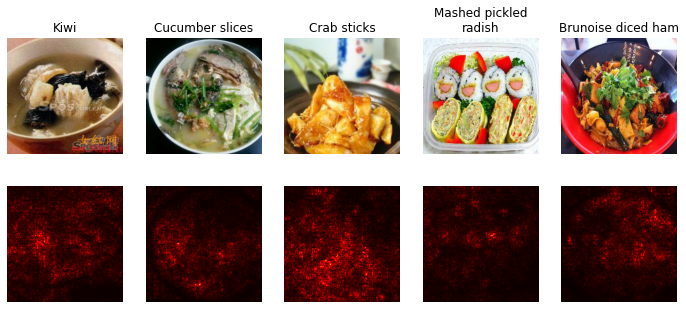

In [76]:
N = 5
line_length = 20
for i in range(N):
    plt.subplot(2, N, i + 1)
    show_img(deprocess(images[[i],:,:,:]))
    plt.axis('off')
    plt.title("\n".join(wrap(ingre_names[int(classes[labels[i]]) - 1], line_length)))
    plt.subplot(2, N, N + i + 1)
    plt.imshow(saliency_list[i][0], cmap=plt.cm.hot)
    plt.axis('off')
    plt.gcf().set_size_inches(12, 5)
plt.show()

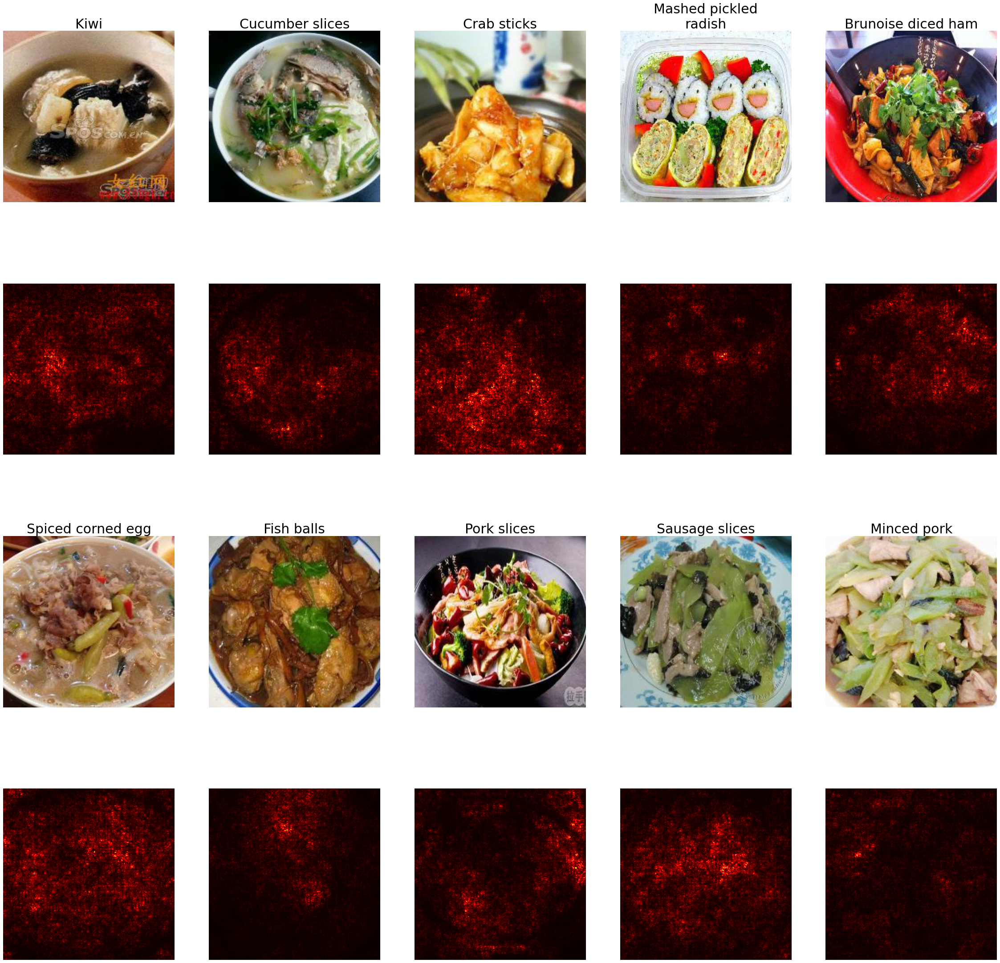

In [77]:
N = 10
line_length = 20
cols = 5
rows = 2 * (N // cols)
for i in range(N):
    plt.subplot(rows, cols, cols*(i//cols) + i + 1)
    show_img(deprocess(images[[i],:,:,:]))
    plt.axis('off')
    plt.title("\n".join(wrap(ingre_names[int(classes[labels[i]]) - 1], line_length)), fontdict = {'fontsize' : 30})
    plt.subplot(rows, cols, cols*(i//cols) + cols + i + 1)
    plt.imshow(saliency_list[i][0], cmap=plt.cm.hot)
    plt.axis('off')
    plt.gcf().set_size_inches(40, 40)
plt.show()

## Class Visualization

Class visualization doesn't yield any interpretable results for ingredients, likely because there is too much variation among all possible dishes containing a specific ingredient. Instead, we show class visualizations of food images using the multi modal model.

In [11]:
# Use the pre-trained Res18 model on ImageNet
res18 = models.resnet18(pretrained=True) # models.resnet50(pretrained=True)
for param in res18.parameters():
    param.requires_grad = False
for param in res18.layer4.parameters(): # Update this from layer4 for resnet50
    param.requires_grad = True
res18.fc = nn.Linear(512, 1000)

class MultiModal(nn.Module):
    def __init__(self, resnet):
        super(MultiModal, self).__init__()
        self.resnet = resnet
        self.relu = nn.ReLU()
        self.food = nn.Linear(1000, 172) # nn.Sequential(nn.Linear(1000, 4096), nn.ReLU(), nn.Dropout(), nn.Linear(4096, 172))
        self.ingredients = nn.Sequential(nn.Linear(1000, 353), nn.Sigmoid()) # nn.Sequential(nn.Linear(1000, 1024), nn.ReLU(), nn.Dropout(), nn.Linear(1024, 353), nn.Sigmoid())

    def forward(self, x):
        a = self.resnet(x)
        b = self.relu(a)
        food_output = self.food(b)
        ingredient_output = self.ingredients(b)
        return (food_output, ingredient_output)

model = MultiModal(res18)
optimizer = optim.Adam(model.parameters())
print(model)
model = gpu(model)

MultiModal(
  (resnet): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_r

In [12]:
# Load the model.
PATH = "../saved_models/ingredients/multi_modal/multi_modal.dat"
loaded_model = torch.load(PATH)
loaded_model = gpu(loaded_model)
model = loaded_model

for param in model.parameters():
    param.requires_grad = False

In [20]:
MODEL_MEAN = np.array([0.485, 0.456, 0.406], dtype=np.float32) # np.array([0.6002, 0.4961, 0.3605], dtype=np.float32)
MODEL_STD = np.array([0.229, 0.224, 0.225], dtype=np.float32) # np.array([0.2681, 0.2808, 0.2984], dtype=np.float32)

def create_class_visualization(target_y, model, dtype, **kwargs):
    """
    Generate an image to maximize the score of target_y under a pretrained model.

    Inputs:
    - target_y: Integer in the range [0, 1000) giving the index of the class
    - model: A pretrained CNN that will be used to generate the image
    - dtype: Torch datatype to use for computations

    Keyword arguments:
    - l2_reg: Strength of L2 regularization on the image
    - learning_rate: How big of a step to take
    - num_iterations: How many iterations to use
    - blur_every: How often to blur the image as an implicit regularizer
    - max_jitter: How much to gjitter the image as an implicit regularizer
    - show_every: How often to show the intermediate result
    """
    model.type(dtype)
    l2_reg = kwargs.pop('l2_reg', 1e-3)
    learning_rate = kwargs.pop('learning_rate', 25)
    num_iterations = kwargs.pop('num_iterations', 300)
    blur_every = kwargs.pop('blur_every', 10)
    max_jitter = kwargs.pop('max_jitter', 16)
    show_every = kwargs.pop('show_every', 25)

    # Randomly initialize the image as a PyTorch Tensor, and make it requires gradient.
    img = torch.randn(1, 3, 224, 224).mul_(1.0).type(dtype).requires_grad_()

    for t in range(num_iterations):
        # Randomly jitter the image a bit; this gives slightly nicer results
        ox, oy = random.randint(0, max_jitter), random.randint(0, max_jitter)
        img.data.copy_(jitter(img.data, ox, oy))
        class_visualization_update_step_multi_modal(img, model, target_y, l2_reg, learning_rate)
        # Undo the random jitter
        img.data.copy_(jitter(img.data, -ox, -oy))

        # As regularizer, clamp and periodically blur the image
        for c in range(3):
            lo = float(-MODEL_MEAN[c] / MODEL_STD[c])
            hi = float((1.0 - MODEL_MEAN[c]) / MODEL_STD[c])
            img.data[:, c].clamp_(min=lo, max=hi)
        if t % blur_every == 0:
            blur_image(img.data, sigma=0.5)

        # Periodically show the image
        if t == 0 or (t + 1) % show_every == 0 or t == num_iterations - 1:
            class_name = class_names[target_y]
            display_image = deprocess(img.data.clone().cpu())
            plt.imshow(display_image)
            file_name = "./multi_modal_visualizations/" + class_name.replace(" ", "_").replace(';', '') + "/iter_" + str(t+1) + ".png"
            display_image.save(file_name)
            
            plt.title('%s\nIteration %d / %d' % (class_name, t + 1, num_iterations))
            plt.gcf().set_size_inches(4, 4)
            plt.axis('off')
            plt.show()

    return deprocess(img.data.cpu())

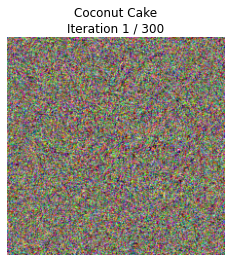

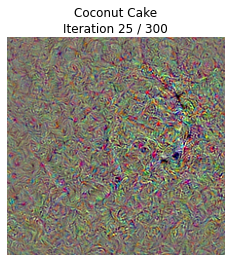

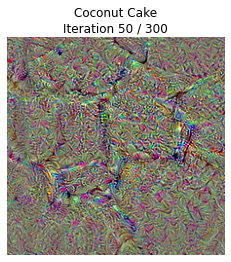

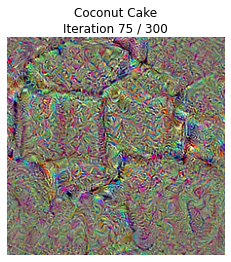

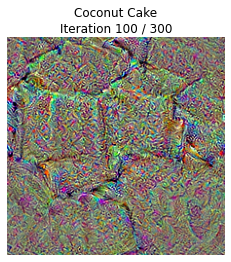

...

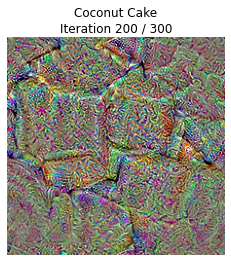

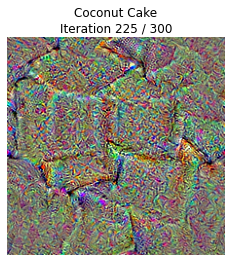

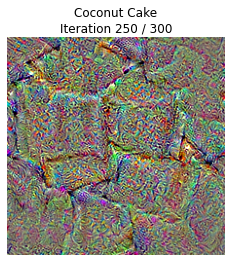

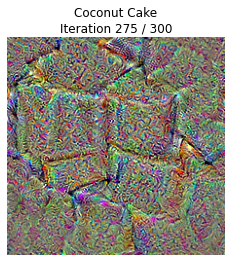

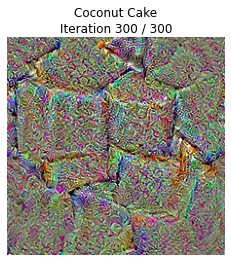

In [21]:
dtype = torch.FloatTensor
model.type(dtype)

target_y = 62 # Coconut Cake
out = create_class_visualization(target_y, model, dtype)

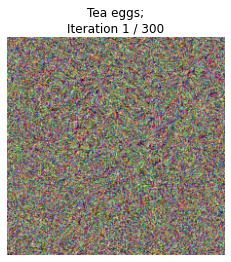

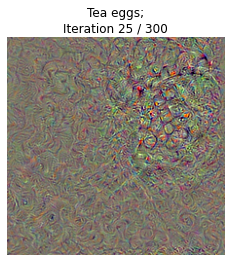

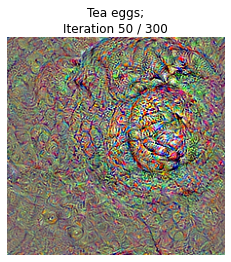

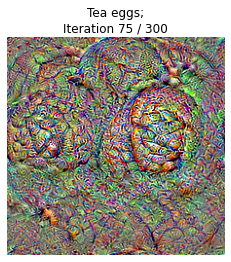

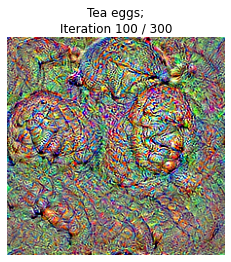

...

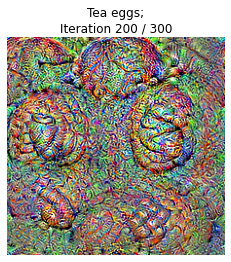

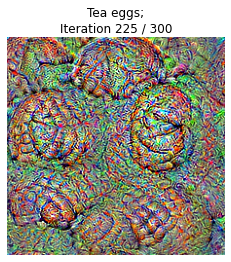

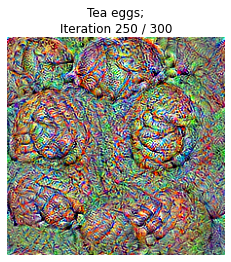

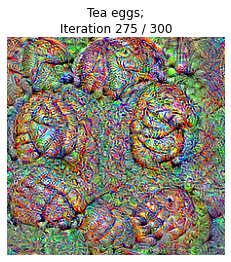

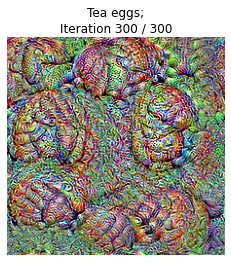

In [22]:
target_y = 110 # Tea eggs
out = create_class_visualization(target_y, model, dtype)

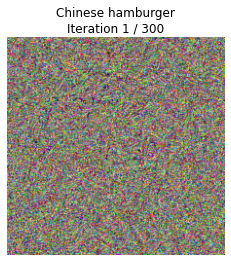

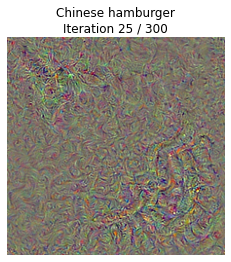

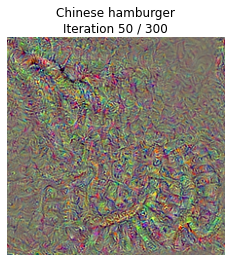

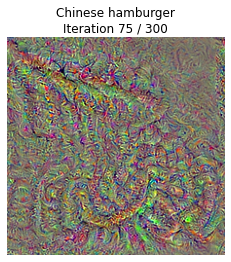

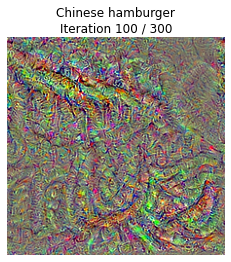

...

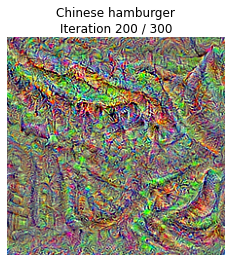

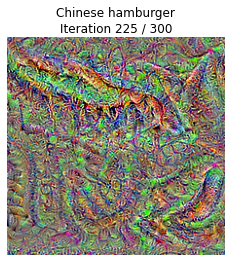

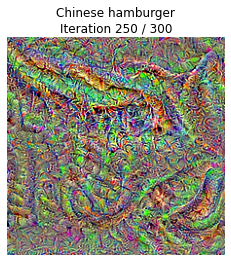

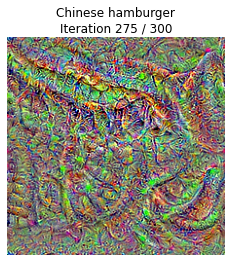

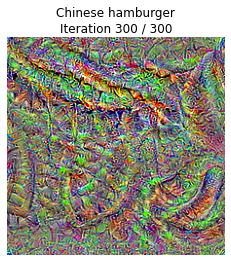

In [23]:
target_y = 47 # Chinese hamburger
out = create_class_visualization(target_y, model, dtype)

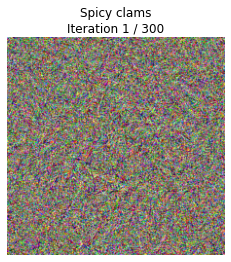

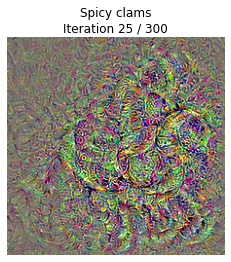

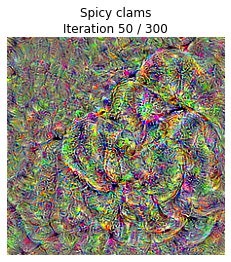

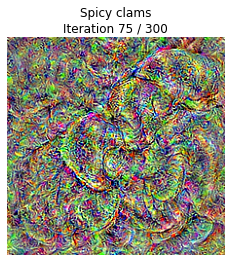

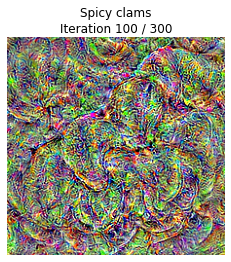

...

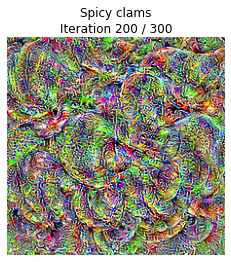

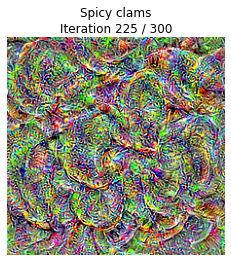

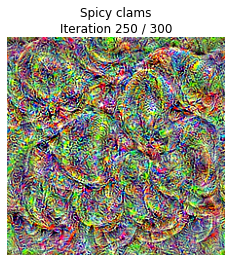

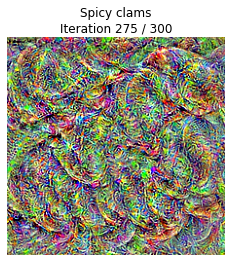

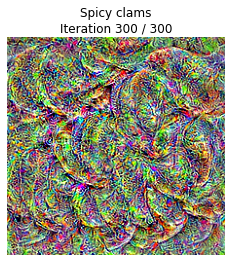

In [24]:
target_y = 158 # Spicy clams
out = create_class_visualization(target_y, model, dtype)